In [1]:
!del /Q utils\__pycache__

In [2]:
import pandas as pd
import os.path

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [4]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [5]:
from utils.datasets import GhlKasperskyDataset, TepHarvardDataset

In [6]:
ds = GhlKasperskyDataset()
# ds = TepHarvardDataset()

In [7]:
ds.shake_not_stir()
gen = ds.test_generator()

In [8]:
test, anomaly, info = next(gen)

In [9]:
test

,input_temp_gc,rt_temp_gc,ht_temp_gc,ct_temp_gc,rt_level_m,ht_level_m,ct_level_m,input_flow,supply_flow,return_flow,output_flow,heater
2022-08-02 03:47:00,10.090332,20.622437,34.131012,56.645660,1.754517,0.600000,0.861635,0,0,0,0,1
2022-08-02 03:48:00,10.090332,20.622437,36.230957,56.645660,1.754517,0.600000,0.861635,0,0,0,0,1
2022-08-02 03:49:00,10.090332,20.622437,38.289154,56.645660,1.754517,0.600000,0.861635,0,0,0,0,1
2022-08-02 03:50:00,10.090332,20.622437,40.306793,56.645660,1.754517,0.600000,0.861635,0,0,0,0,1
2022-08-02 03:51:00,10.090332,20.622437,42.283691,56.645660,1.754517,0.600000,0.861635,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-03 07:29:00,4.999237,49.925903,57.628571,56.977478,1.999962,0.100000,1.744060,0,0,0,0,0
2022-08-03 07:30:00,4.999237,49.925903,53.300842,56.977478,1.956383,0.143579,1.744060,0,1,0,0,0
2022-08-03 07:31:00,4.999237,49.925873,51.797241,56.977478,1.499962,0.600000,1.744060,0,0,0,0,1
2022-08-03 07:32:00,4.999237,49.925873,53.544922,56.977478,1.499962,0.600000,1.744060,0,0,0,0,1


<AxesSubplot:>

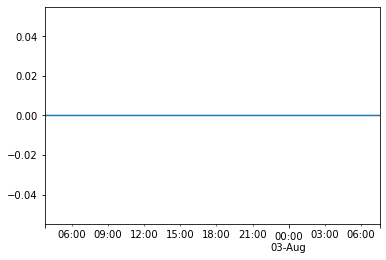

In [10]:
anomaly.plot()

## Seaborn

<AxesSubplot:>

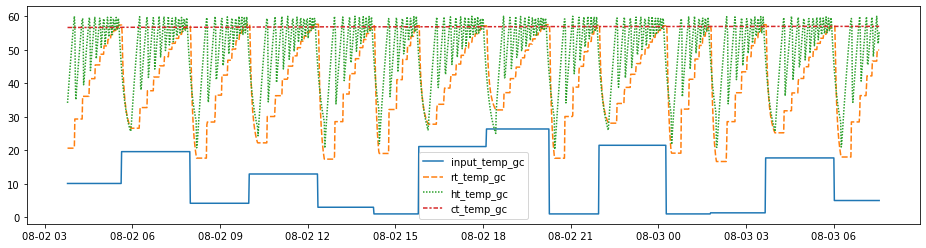

In [11]:
plt.figure(figsize=(16,4))
sns.lineplot(data=test[['input_temp_gc', 'rt_temp_gc', 'ht_temp_gc', 'ct_temp_gc']])

## Plotly express

In [12]:
fig = px.line(test[['input_temp_gc', 'rt_temp_gc', 'ht_temp_gc', 'ct_temp_gc']])
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [13]:
fig = px.line(test[['rt_level_m', 'ht_level_m', 'ct_level_m']])
fig.show()

## Plotly graph_objects

In [14]:
all_columns = test.columns
clm_types = ('level_m', 'temp_gc', 'flow')
clm_subsets = []
for t in clm_types:
    clm_subsets.append([c for c in all_columns if c.endswith(t)])
clm_subsets.append([c for c in all_columns if not c.endswith(clm_types)])
clm_subsets

[['rt_level_m', 'ht_level_m', 'ct_level_m'],
 ['input_temp_gc', 'rt_temp_gc', 'ht_temp_gc', 'ct_temp_gc'],
 ['input_flow', 'supply_flow', 'return_flow', 'output_flow'],
 ['heater']]

In [15]:
fig = make_subplots(rows=len(clm_subsets))
fig.add_trace(go.Scatter(x=test.index, y=test['rt_level_m']), row=1, col=1)
fig.add_trace(go.Scatter(x=test.index, y=test['input_temp_gc']), row=2, col=1)
fig.add_trace(go.Scatter(x=test.index, y=test['input_flow']), row=3, col=1)
fig.update_xaxes(matches='x')
fig.update_layout(height=600, width=800, title_text="Side By Side Subplots")
fig.show()

In [16]:
fig = make_subplots(rows=len(clm_subsets), shared_xaxes=True, vertical_spacing=0.02)
fig.add_trace(go.Scatter(x=test.index, y=test['rt_level_m']), row=1, col=1)
fig.add_trace(go.Scatter(x=test.index, y=test['ht_level_m']), row=1, col=1)
fig.add_trace(go.Scatter(x=test.index, y=test['input_temp_gc']), row=2, col=1)
fig.add_trace(go.Scatter(x=test.index, y=test['ht_temp_gc']), row=2, col=1)
fig.add_trace(go.Scatter(x=test.index, y=test['input_flow']), row=3, col=1)
# fig.update_xaxes(matches='x')
fig.update_layout(height=600, width=990, title_text="Stacked Subplots")
fig.show()

In [17]:
clm_subsets

[['rt_level_m', 'ht_level_m', 'ct_level_m'],
 ['input_temp_gc', 'rt_temp_gc', 'ht_temp_gc', 'ct_temp_gc'],
 ['input_flow', 'supply_flow', 'return_flow', 'output_flow'],
 ['heater']]

## adtk plot

In [18]:
ds = TepHarvardDataset()
ds.shake_not_stir()
gen = ds.test_generator()
for data, anomalies, info in gen:
    if max(anomalies):
        break

In [19]:
anomalies[anomalies>0]

2022-08-01 08:00:00    4
2022-08-01 08:03:00    4
2022-08-01 08:06:00    4
2022-08-01 08:09:00    4
2022-08-01 08:12:00    4
                      ..
2022-08-02 23:45:00    4
2022-08-02 23:48:00    4
2022-08-02 23:51:00    4
2022-08-02 23:54:00    4
2022-08-02 23:57:00    4
Freq: 3T, Name: anomaly, Length: 800, dtype: uint8

In [20]:
data.columns

Index(['inp_a_flow_ksm3h', 'inp_d_flow_kgh', 'inp_e_flow_kgh',
       'inp_c_flow_ksm3h', 'recyl_flow_ksm3h', 'react_flow_ksm3h',
       'react_press_kpa', 'react_level_pc', 'react_temp_gc',
       'purge_flow_ksm3h', 'seprt_temp_gc', 'seprt_level_pc',
       'seprt_press_kpa', 'seprt_flow_m3h', 'strip_level_pc',
       'strip_press_kpa', 'prod_flow_m3h', 'strip_temp_gc', 'steam_flow_kgh',
       'compr_power_kw', 're_cl_temp_gc', 'co_cl_temp_gc', 'react_a_prt_molp',
       'react_b_prt_molp', 'react_c_prt_molp', 'react_d_prt_molp',
       'react_e_prt_molp', 'react_f_prt_molp', 'purge_a_prt_molp',
       'purge_b_prt_molp', 'purge_c_prt_molp', 'purge_d_prt_molp',
       'purge_e_prt_molp', 'purge_f_prt_molp', 'purge_g_prt_molp',
       'purge_h_prt_molp', 'prod_d_prt_molp', 'prod_e_prt_molp',
       'prod_f_prt_molp', 'prod_g_prt_molp', 'prod_h_prt_molp',
       'inp_d_feed_pc', 'inp_e_feed_pc', 'inp_a_feed_pc', 'inp_c_feed_pc',
       'compr_valv_pc', 'purge_feed_pc', 'seprt_feed_pc'

In [21]:
all_columns = data.columns
clm_types = ('flow_ksm3h', 'flow_kgh', 'press_kpa', 'level_pc', 'temp_gc', 'prt_molp', 'feed_pc')
clm_subsets = []
for t in clm_types:
    clm_subsets.append([c for c in all_columns if c.endswith(t)])
clm_subsets.append([c for c in all_columns if not c.endswith(clm_types)])

In [22]:
from adtk.visualization import plot

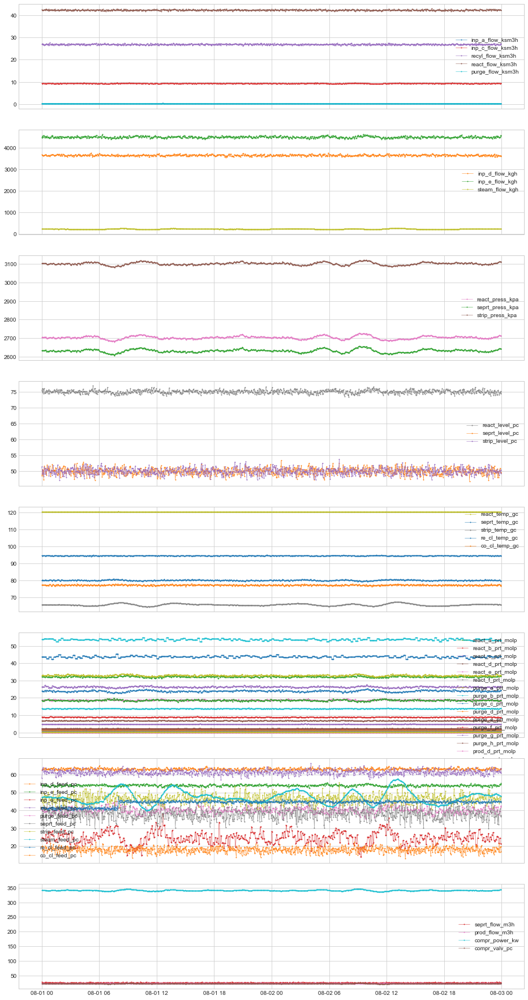

In [23]:
plot(ts=data, 
     anomaly=anomalies, 
     curve_group=clm_subsets, 
     ts_linewidth=0.5, 
     ts_color=None, 
     ts_alpha=1.0, 
     ts_marker='.', 
     ts_markersize=2, 
     match_curve_name=True, 
     anomaly_tag='span', 
     anomaly_color='red', 
     anomaly_alpha=0.3, 
     anomaly_marker='o', 
     anomaly_markersize=4, 
     freq_as_period=True, 
     axes=None, 
     figsize=None, 
     legend=True
    );

In [24]:
from utils.custom_plots import get_suffixes, plot_stacked

In [26]:
plot_stacked(data=data,
             title=info,
             anomalies=anomalies,
             suffixes=get_suffixes(ds),
             height=200,
            )